In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
import numpy as np
import deepxde as dde
import tensorflow as tf


# Load the Excel file into a pandas DataFrame
df = pd.read_excel('Hydrostatic Data with Nodes.xlsx')  # Replace with your file path

# Sample n points randomly from the DataFrame
n = 400  # Specify how many points you want to sample
sampled_data = df.sample(n=n)

# Split the data into training (60%) and testing (40%)
train_data, test_data = train_test_split(sampled_data, test_size=0.4, random_state=42)

# Training data
x_train = np.array(train_data['x'].values).reshape(-1, 1)  # Extract the x values for training
y_train = np.array(train_data['y'].values).reshape(-1, 1)   # Extract the y values for training
sigma_train =np.array(train_data['sigma'].values).reshape(-1, 1)  # Extract the sigma values for training

# Testing data
x_test = np.array(test_data['x'].values).reshape(-1, 1)  # Extract the x values for testing
y_test = np.array(test_data['y'].values).reshape(-1, 1)  # Extract the y values for testing
sigma_test = np.array(test_data['sigma'].values).reshape(-1, 1) # Extract the sigma values for testing

print(x_train)
print(y_train)
print(sigma_train)
Com=np.stack((x_train,y_train))
com=Com.T
print(com)


Using backend: tensorflow.compat.v1
Other supported backends: tensorflow, pytorch, jax, paddle.
paddle supports more examples now and is recommended.



Instructions for updating:
non-resource variables are not supported in the long term
[[0.02268263]
 [0.05198942]
 [0.03480958]
 [0.01864032]
 [0.03177784]
 [0.02672495]
 [0.003968  ]
 [0.00530472]
 [0.03177784]
 [0.03480958]
 [0.0043    ]
 [0.03480958]
 [0.00323297]
 [0.03885189]
 [0.04693653]
 [0.03278842]
 [0.00544043]
 [0.00230413]
 [0.00140555]
 [0.00493076]
 [0.053     ]
 [0.00088621]
 [0.02874611]
 [0.00312814]
 [0.00878454]
 [0.02066147]
 [0.053     ]
 [0.0032308 ]
 [0.00397029]
 [0.00521357]
 [0.00242805]
 [0.00270368]
 [0.04693653]
 [0.053     ]
 [0.01864032]
 [0.00179995]
 [0.04693653]
 [0.02571437]
 [0.00109895]
 [0.0055156 ]
 [0.00464882]
 [0.00101298]
 [0.00225939]
 [0.00834171]
 [0.00834171]
 [0.02470379]
 [0.01864032]
 [0.01355529]
 [0.00422262]
 [0.03076726]
 [0.00521357]
 [0.00127125]
 [0.01661916]
 [0.00490754]
 [0.053     ]
 [0.02268263]
 [0.03582016]
 [0.02672495]
 [0.01359024]
 [0.03582016]
 [0.03784132]
 [0.00395769]
 [0.00324775]
 [0.00378734]
 [0.01661916]
 [0.

In [2]:
from sklearn.preprocessing import StandardScaler

data_x=np.column_stack((x_train,y_train))
data_x=data_x
print(data_x.shape)

data_sigma=np.array(sigma_train)
test_x=np.column_stack((x_test,y_test))
test_x=test_x
print(test_x.shape)

test_sigma=np.array(sigma_test)

# Apply StandardScaler to the training and testing data
scaler_x = StandardScaler()
scaler_s = StandardScaler()

data_x = scaler_x.fit_transform(data_x)
data_sigma=scaler_s.fit_transform(data_sigma)
test_x = scaler_x.transform(test_x)
test_sigma=scaler_s.transform(test_sigma)

print(data_x)
print(data_sigma)
data = dde.data.dataset.DataSet(X_train=data_x, y_train=data_sigma, X_test=test_x, y_test=test_sigma)



(240, 2)
(160, 2)
[[ 0.21662742  1.56749401]
 [ 2.02532893 -0.63799204]
 [ 0.96505559  1.56749401]
 [-0.03284868 -0.35985894]
 [ 0.77794869  1.8977986 ]
 [ 0.46610351  2.1180018 ]
 [-0.9383669  -0.8990365 ]
 [-0.85587016 -0.83842522]
 [ 0.77794869  0.79678322]
 [ 0.96505559  1.07203701]
 [-0.91787736 -1.08300499]
 [ 0.96505559  1.7326462 ]
 [-0.98373056 -0.52379538]
 [ 1.21453168 -0.30423231]
 [ 1.71348388  2.1180018 ]
 [ 0.84031766 -0.02897846]
 [-0.84749435 -0.96046373]
 [-1.04105483 -0.76769147]
 [-1.0965115  -0.87174404]
 [-0.87894938 -0.99530274]
 [ 2.08769791  1.34729081]
 [-1.12856304 -0.79076309]
 [ 0.59084156 -0.24918156]
 [-0.99019984 -0.08402926]
 [-0.64110911 -0.76714349]
 [ 0.09188937 -0.13907996]
 [ 2.08769791  1.12708781]
 [-0.98386402 -0.58371639]
 [-0.9382255  -0.9696294 ]
 [-0.86149526  0.90688462]
 [-1.03340682 -0.75167247]
 [-1.01639636 -0.78716777]
 [ 1.71348388  0.52152923]
 [ 2.08769791 -0.52673878]
 [-0.03284868 -1.02737837]
 [-1.07217091 -0.85631086]
 [ 1.71348

Compiling model...
Building feed-forward neural network...

'build' took 0.203721 s



c:\Users\yesda\Documents\GitHub\PINN_testing\.conda\Lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:116: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(



'compile' took 0.412799 s

Training model...

Step      Train loss    Test loss     Test metric
0         [1.09e+00]    [1.84e+00]    []  
1000      [4.62e-04]    [2.19e-03]    []  
2000      [1.11e-04]    [6.63e-04]    []  
3000      [1.18e-04]    [6.49e-04]    []  
4000      [6.07e-05]    [4.06e-04]    []  
5000      [4.51e-05]    [2.98e-04]    []  
6000      [2.99e-04]    [4.74e-04]    []  
7000      [3.21e-05]    [2.42e-04]    []  
8000      [2.92e-05]    [2.02e-04]    []  
9000      [2.84e-04]    [4.54e-04]    []  
10000     [1.31e-04]    [2.65e-04]    []  
11000     [1.95e-05]    [1.76e-04]    []  
12000     [1.83e-05]    [1.68e-04]    []  
13000     [4.57e-05]    [1.83e-04]    []  
14000     [1.92e-05]    [1.82e-04]    []  
15000     [4.84e-05]    [2.68e-04]    []  
16000     [1.33e-05]    [1.67e-04]    []  
17000     [1.18e-05]    [1.58e-04]    []  
18000     [1.78e-05]    [1.77e-04]    []  
19000     [1.06e-05]    [1.58e-04]    []  
20000     [6.17e-04]    [1.01e-03]    []  


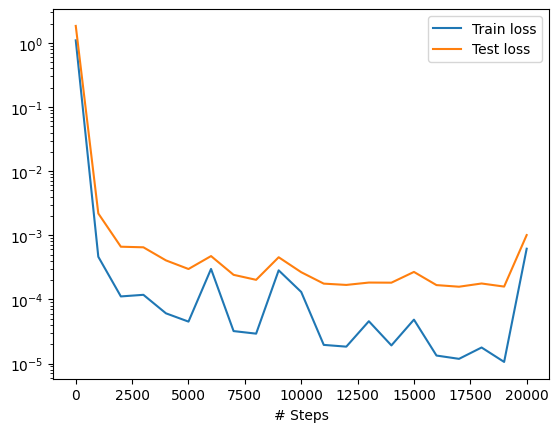

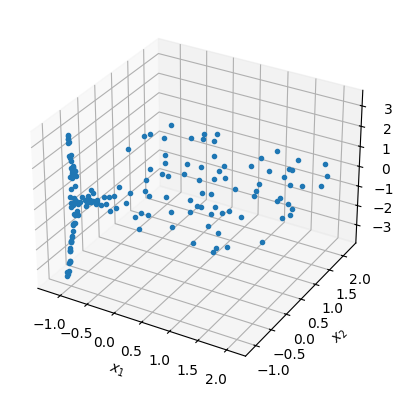

In [3]:
# Define the network for σ
layer_size = [2] + [60] * 10 + [1]  # 2 inputs (x, y ) -> hidden layers -> 1 output (σ)
activation = "tanh"
initializer = "Glorot uniform"
net_sigma = dde.nn.FNN(layer_size, activation,initializer)

# Define the model
model_sigma = dde.Model(data, net_sigma)

# Compile the model with data
model_sigma.compile("adam", lr=1e-4)

# Train the model
losshistory, train_state = model_sigma.train(epochs=20000)

dde.saveplot(losshistory, train_state, issave=True, isplot=True)

0       0.014598
1       0.014598
2       0.014598
3       0.014598
4       0.014598
          ...   
3996    0.001037
3997    0.001158
3998    0.001352
3999    0.001268
4000    0.002116
Name: x, Length: 4001, dtype: float64
[[0.014112  ]
 [0.01610713]
 [0.01810226]
 ...
 [0.0049515 ]
 [0.00508507]
 [0.00575253]]
[[0.014598   0.014112  ]
 [0.014598   0.01610713]
 [0.014598   0.01810226]
 ...
 [0.0013522  0.0049515 ]
 [0.00126786 0.00508507]
 [0.00211575 0.00575253]]
Mean Absolute Percentage Error: 15.24%
R² Score: 1.00


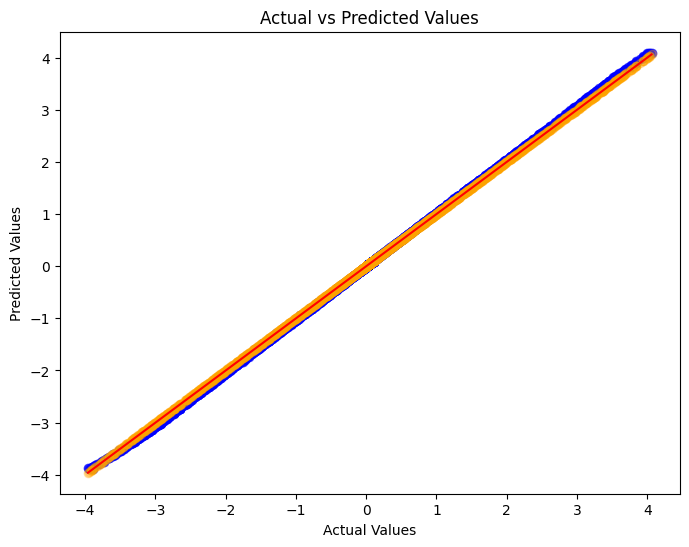

In [4]:
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_percentage_error, r2_score


Xx=df.iloc[:,1]
print(Xx)
Xx=np.array(Xx.tolist()).reshape(-1,1)

Y=df.iloc[:,2]
Y=np.array(Y.tolist()).reshape(-1,1)
print(Y)
Cor=np.column_stack([Xx,Y])
print(Cor)
Cor=scaler_x.transform(Cor)

# Assuming `model_sigma` is your trained model
# `X_test` is your test input data and `y_test` is the actual test output data

# Get predictions on test data
S_p = model_sigma.predict(Cor)
S_t=df.iloc[:,3]
#print(S_t)
S_t=np.array(S_t.tolist()).reshape(-1,1)
S_t=scaler_s.transform(S_t)
#print("First few actual values:", S_t[:5])
#print("First few predicted values:", S_p[:5])
# Calculate Mean Absolute Percentage Error (MAPE)
mape = mean_absolute_percentage_error(S_t, S_p) * 100
print(f"Mean Absolute Percentage Error: {mape:.2f}%")

# Calculate R² Score
r2 = r2_score(S_t, S_p)
print(f"R² Score: {r2:.2f}")

# Plot the actual vs predicted values for test data
plt.figure(figsize=(8, 6))

# Scatter plot for actual values
plt.scatter(S_t, S_p, alpha=0.7, color='blue', label='Predicted Values')
# Scatter plot for testing data (Actual Values)
plt.scatter(S_t, S_t, alpha=0.3, color='orange', label='Actual Values')
plt.plot([min(S_t), max(S_t)], [min(S_t), max(S_t)], color='red')  # Identity line
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values')
plt.show()


In [60]:
df = pd.read_excel('Hydrostatic Data with Nodes.xlsx')
Xx=df.iloc[:,1]

Xx=np.array(Xx.tolist()).reshape(-1,1)

Y=df.iloc[:,2]
Y=np.array(Y.tolist()).reshape(-1,1)


# Example y_pred with 2 samples and 5 time steps
y_pred = np.array([
    [0.1, 0.2, 0.3, 0.4, 0.5],  # First sample
    [0.6, 0.7, 0.8, 0.9, 1.0]   # Second sample
])

# Display the y_pred array
print("y_pred array:")
print(y_pred)

# Determine the number of samples and time steps
num_samples = y_pred.shape[0]
num_time_steps = y_pred.shape[1]

print("\nNumber of samples:", num_samples)
print("Number of time steps:", num_time_steps)

num_samples = y_pred.shape[0]  # Number of samples across all time steps
num_time_steps = y_pred.shape[1]  # Number of time steps
# Get X, Y coordinates for the selected indices
idx1 = np.random.randint(0, num_samples)
idx2 = np.random.randint(0, num_samples)
x_A, y_A = Xx[idx1], Y[idx1]
x_B, y_B = Xx[idx2], Y[idx2]
      
print([x_A,y_A])

y_pred array:
[[0.1 0.2 0.3 0.4 0.5]
 [0.6 0.7 0.8 0.9 1. ]]

Number of samples: 2
Number of time steps: 5
[array([0.014598]), array([0.014112])]


In [6]:

# Retrieve the (x, y) coordinates using tf.gather
coords_A = tf.gather(Cor, idx1)
coords_B = tf.gather(Cor, idx2)
print(coords_A)
x_A = coords_A[0]
print(x_A)
coords_A_np = coords_A.numpy() if tf.executing_eagerly() else tf.compat.v1.Session().run(coords_A)
coords_B_np = coords_B.numpy() if tf.executing_eagerly() else tf.compat.v1.Session().run(coords_B) 
# Predict sigma (hydrostatic stress) for the selected coordinates
sigma_A = model_sigma.predict([coords_A_np])
sigma_B = model_sigma.predict([coords_B_np])
        

Tensor("GatherV2:0", shape=(2,), dtype=float64)
Tensor("strided_slice:0", shape=(), dtype=float64)


In [7]:

num_samples = tf.shape(y_pred)[0]
num_time_steps = tf.shape(y_pred)[1]
print(num_samples)  
print(num_time_steps) 
last_time_idx = num_time_steps - 1
C_last_time_step = tf.gather(y_pred, last_time_idx, axis=1)
C_last_time_step = C_last_time_step.numpy() if tf.executing_eagerly() else tf.compat.v1.Session().run(coords_B) 
print(C_last_time_step)

Tensor("strided_slice_1:0", shape=(), dtype=int32)
Tensor("strided_slice_2:0", shape=(), dtype=int32)
[-0.28232471 -0.19413076]


Compiling model...
Building feed-forward neural network...
'build' took 0.094599 s



c:\Users\yesda\Documents\GitHub\PINN_testing\.conda\Lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:116: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 241.904056 s

Training model...

Step      Train loss              Test loss               Test metric
0         [8.36e-05, 4.00e-04]    [6.63e-04, 9.33e-04]    []  
1000      [2.35e-04, 4.99e-05]    [4.47e-04, 3.59e-05]    []  
2000      [4.70e-05, 1.04e-05]    [6.07e-05, 2.01e-05]    []  
3000      [5.87e-05, 3.14e-05]    [6.70e-04, 2.28e-05]    []  
4000      [2.15e-04, 8.81e-06]    [4.87e-05, 6.92e-06]    []  
5000      [9.14e-06, 5.17e-06]    [8.81e-05, 1.62e-05]    []  
6000      [6.97e-06, 2.73e-06]    [1.10e-04, 2.33e-06]    []  
7000      [3.29e-06, 2.14e-06]    [4.83e-05, 3.86e-06]    []  
8000      [4.66e-06, 1.84e-06]    [3.91e-05, 1.85e-06]    []  
9000      [4.33e-06, 7.91e-07]    [5.08e-06, 9.64e-07]    []  
10000     [1.06e-05, 7.46e-06]    [5.27e-05, 1.07e-05]    []  
11000     [1.12e-06, 1.45e-07]    [1.22e-05, 2.95e-07]    []  
12000     [6.16e-07, 3.02e-07]    [1.07e-05, 2.74e-07]    []  
13000     [2.65e-07, 1.68e-07]    [2.54e-06, 9.01e-08]    []  


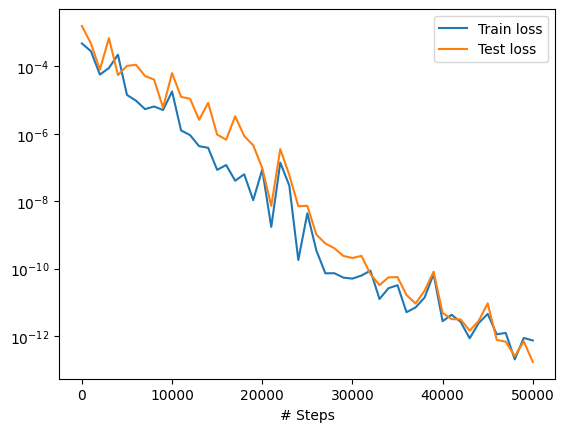

In [71]:
import tensorflow as tf

R = 4e-3/12e-2
L= 1 #12e-2
t_last= 1 #4.2e5


square = dde.geometry.Rectangle([-L, -L], [L, L])

circle = dde.geometry.Disk([0, 0], R)

# Geometry and time domain
geom = dde.geometry.csg.CSGDifference(square, circle)
timedomain = dde.geometry.TimeDomain(0, t_last)
geomtime = dde.geometry.GeometryXTime(geom, timedomain)

# Create the initial and boundary conditions
ic = dde.icbc.IC(geomtime, lambda x: 20, lambda _, on_initial: on_initial)

def pde_C_L(x, C_L):
    dC_L_dt = dde.grad.jacobian(C_L, x, i=0, j=2)
    dC_L_dx2 = dde.grad.hessian(C_L, x, i=0, j=0)
    dC_L_dy2 = dde.grad.hessian(C_L, x, i=0, j=1)
    eq = dC_L_dt - (1/3.8) * (dC_L_dx2 + dC_L_dy2)
    return eq

data = dde.data.TimePDE(
    geomtime,
    pde_C_L,[ic],
    num_domain=1000,
    #num_boundary=150,
    num_initial=1000,
    num_test=1000,
    )

# Network for C_L
layer_size = [3] + [128] * 8 + [1]  
activation = "tanh"
initializer = "Glorot uniform"
net_C_L = dde.nn.FNN(layer_size, activation, initializer)
num_time_steps = 5
num_features=3

def custom_loss(y_true, y_pred):
    constraint_loss = 0.0
    num_pairs = 10
    num_samples = 1000
    
    last_time_idx = tf.shape(y_pred)[1] - 1
    C_last_time_step = y_pred[:, last_time_idx]    
    

    for _ in range(num_pairs):
        # Randomly select indices for C at the last time step
        idx1 = tf.random.uniform([], minval=0, maxval=num_samples, dtype=tf.int32)
        idx2 = tf.random.uniform([], minval=0, maxval=num_samples, dtype=tf.int32)
        
        # Retrieve the (x, y) coordinates using tf.gather
        coords_A = tf.gather(Cor, idx1)
        coords_B = tf.gather(Cor, idx2)

        coords_A = coords_A.numpy() if tf.executing_eagerly() else tf.compat.v1.Session().run(coords_A)
        coords_B = coords_B.numpy() if tf.executing_eagerly() else tf.compat.v1.Session().run(coords_B) 
        # Predict sigma (hydrostatic stress) for the selected coordinates
        sigma_A = model_sigma.predict([coords_A])
        sigma_B = model_sigma.predict([coords_B])
        
        # Compute the exponent for the constraint equation
        VH, R, T = 2e-6, 8.34, 298  # Modify constants as needed
        exponent = (VH / (R * T)) * (sigma_A - sigma_B)
        
        # Assuming idx1 and idx2 are indices generated by TensorFlow operations
        C_A = tf.gather(C_last_time_step, idx1)
        C_B = tf.gather(C_last_time_step, idx2)

        # Calculate the constraint loss
        constraint_loss += tf.reduce_mean(tf.square(C_A - C_B * tf.exp(exponent)))
    
    # Normalize the constraint loss by the number of pairs
    constraint_loss /= num_pairs
    
    # Return the combined loss (standard loss + constraint loss)
    total_loss = constraint_loss
    return total_loss


model= dde.Model(data, net_C_L)

model.compile("adam", lr=1e-2, loss=custom_loss)
# Define the model with the PDE, initial and boundary conditions

# Add the callback when training the model
losshistory, train_state = model.train(epochs=50000)

# Optionally plot and save results
dde.saveplot(losshistory, train_state, issave=True, isplot=True)

In [72]:
import pandas as pd

# Load the coordinates file (Excel or CSV)
# For Excel:
coordinates_df = pd.read_excel('Hydrostatic Data with Nodes.xlsx') 

# Display the first few rows to verify the data
print(coordinates_df.head())

# Assuming the file has columns named 'x' and 'y'
x_coords = np.array(coordinates_df['x'].values).reshape(-1,1)
y_coords = np.array(coordinates_df['y'].values).reshape(-1,1)

# Verify the extracted coordinates
print("X coordinates:", x_coords)
print("Y coordinates:", y_coords)

scaler_1=StandardScaler()
x_coords=scaler_1.fit_transform(x_coords)
scaler_2=StandardScaler()
y_coords=scaler_2.fit_transform(y_coords)

# Load Excel data (or CSV for demonstration purposes)
df = pd.read_excel('hydrogen_concentration.xlsx') 
time = df['time'].values
time=np.array(time.tolist())/1000000
print(time)
x_coords = np.ravel(np.array(x_coords).reshape([1,-1]))
print(x_coords.shape)
y_coords = np.ravel(np.array(y_coords).reshape([1,-1]))
print(y_coords.shape)
time_steps = np.ravel(np.array(time).reshape([1,-1]))  # Example time steps
print(time_steps.shape)

predictions = np.zeros((len(x_coords), len(y_coords), len(time_steps)))

# Loop through each time step
for t_idx, t in enumerate(time_steps):
    # Loop through all (x, y) combinations
    for i, (x, y) in enumerate(zip(x_coords, y_coords)):
        input_data = np.array([x, y,t]) 
        #print(f"Predicting for x={x}, y={y}, t={t} (normalized: {test_time})")
        # Make the prediction for this (x, y, t) combination
        prediction = model.predict([input_data])[0][0]
        print(f"Prediction for (x={x}, y={y}, t={t}): {prediction}")
        # Extract the scalar prediction value (ensure it's not a sequence)
        
        predictions[:,i,t_idx]=prediction
        # Store the prediction in the correct location
predictions=np.array(predictions[0]).T        
print(predictions)  




     node         x         y       sigma
0  node_1  0.014598  0.014112  43584350.6
1  node_2  0.014598  0.016107  43195861.8
2  node_3  0.014598  0.018102  42957984.9
3  node_4  0.014598  0.020097  42829105.4
4  node_5  0.014598  0.022093  42774711.6
X coordinates: [[0.014598  ]
 [0.014598  ]
 [0.014598  ]
 ...
 [0.0013522 ]
 [0.00126786]
 [0.00211575]]
Y coordinates: [[0.014112  ]
 [0.01610713]
 [0.01810226]
 ...
 [0.0049515 ]
 [0.00508507]
 [0.00575253]]
[0.   0.01 0.02 0.03 0.04 0.05 0.06 0.07 0.08 0.09 0.1  0.11 0.12 0.13
 0.14 0.15 0.16 0.17 0.18 0.19 0.2  0.21 0.22 0.23 0.24 0.25 0.26 0.27
 0.28 0.29 0.3  0.31 0.32 0.33 0.34 0.35 0.36 0.37 0.38 0.39 0.4  0.41
 0.42 0.43 0.44 0.45 0.46 0.47 0.48 0.49 0.5  0.51 0.52 0.53 0.54 0.55
 0.56 0.57 0.58 0.59 0.6  0.61 0.62 0.63 0.64 0.65 0.66 0.67 0.68 0.69
 0.7  0.71 0.72 0.73 0.74 0.75 0.76 0.77 0.78 0.79 0.8  0.81 0.82 0.83
 0.84 0.85 0.86 0.87 0.88 0.89 0.9  0.91 0.92 0.93 0.94 0.95 0.96 0.97
 0.98 0.99 1.  ]
(4001,)
(4001,)
(101,)
P

KeyboardInterrupt: 

In [68]:
import os
def delete_file(filepath):
    # Check if the file exists
    if os.path.exists(filepath):
        try:
            # Delete the file
            os.remove(filepath)
            print(f"File {filepath} successfully deleted.")
        except Exception as e:
            print(f"Error deleting file {filepath}: {e}")
    else:
        print(f"File {filepath} does not exist.")
filepath = "predictions_output.xlsx"

# Delete the file
delete_file(filepath)

print(predictions)
# Flatten the x_coords and y_coords arrays for labeling the columns
x_coords_flat = np.ravel(x_coords)
y_coords_flat = np.ravel(y_coords)

# Prepare column labels as "(x, y)" pairs
column_labels = [f"node_{i+1}" for i in range(len(x_coords_flat))]

# Prepare data for Excel: each row corresponds to a time step, each column to an (x, y) node

# Create a Pandas DataFrame with time steps as rows and (x, y) as columns
df = pd.DataFrame(predictions, columns=column_labels)

# Add a "Time" column to label the time steps
df.insert(0,"time", (time_steps.flatten())*1000000)

# Export the DataFrame to an Excel file
df.to_excel("predictions_output.xlsx", index=False)

print("Data has been successfully exported to predictions_output.xlsx")


from sklearn.metrics import mean_squared_error, mean_absolute_error

# Load the two Excel files, skipping the first row and first column
df1 = pd.read_excel('hydrogen_concentration.xlsx').iloc[2:, 1:]
df2 = pd.read_excel('predictions_output.xlsx').iloc[2:, 1:]

# Ensure the data is aligned by resetting the indices
df1 = df1.reset_index(drop=True)
df2 = df2.reset_index(drop=True)

# Convert the dataframes to NumPy arrays for easy comparison
data1 = df1.to_numpy()
data2 = df2.to_numpy()

# Calculate similarity metrics
mse = mean_squared_error(data1, data2)
mae = mean_absolute_error(data1, data2)

# Print the results
print(f"Mean Squared Error (MSE): {mse}")
print(f"Mean Absolute Error (MAE): {mae}")

# Optionally, compute element-wise absolute differences
difference = abs(data1 - data2)
print(f"Max Absolute Difference: {difference.max()}")


File predictions_output.xlsx does not exist.
[[-0.33410814 -0.33410838 -0.33410871 ... -0.33410719 -0.33410698
  -0.33410734]
 [-0.3341085  -0.33410844 -0.33410853 ... -0.33410692 -0.33410707
  -0.33410683]
 [-0.33410847 -0.33410811 -0.33410826 ... -0.33410677 -0.33410671
  -0.3341068 ]
 ...
 [-0.3340908  -0.3340902  -0.33408895 ... -0.3340987  -0.33409867
  -0.33409792]
 [-0.33409065 -0.33408982 -0.33408913 ... -0.33409899 -0.33409873
  -0.33409801]
 [-0.33409083 -0.33408988 -0.33408871 ... -0.33409905 -0.33409905
  -0.33409816]]
Data has been successfully exported to predictions_output.xlsx
Mean Squared Error (MSE): 413.8164353253637
Mean Absolute Error (MAE): 20.338777904056293
Max Absolute Difference: 21.826032504057313


In [ ]:
import os
import json

# Define the file where errors will be stored
error_file = 'previous_errors.json'

# Step 1: Load previous errors
if os.path.exists(error_file):
    with open(error_file, 'r') as file:
        previous_errors = json.load(file)
else:
    previous_errors = {'MSE': None, 'MAE': None, 'MaxDiff': None}

# Step 2: Calculate current errors
current_errors = {
    'MSE': mse,  # Replace with your actual calculation
    'MAE': mae,  # Replace with your actual calculation
    'MaxDiff': difference  # Replace with your actual calculation
}

# Step 3: Compare current and previous errors
if previous_errors['MSE'] is not None:
    print(f"Difference in MSE: {current_errors['MSE'] - previous_errors['MSE']}")
    print(f"Difference in MAE: {current_errors['MAE'] - previous_errors['MAE']}")
    print(f"Difference in MaxDiff: {current_errors['MaxDiff'] - previous_errors['MaxDiff']}")
else:
    print("No previous errors to compare against.")

# Step 4: Save current errors for the next run
with open(error_file, 'w') as file:
    json.dump(current_errors, file)


JSONDecodeError: Expecting value: line 1 column 68 (char 67)

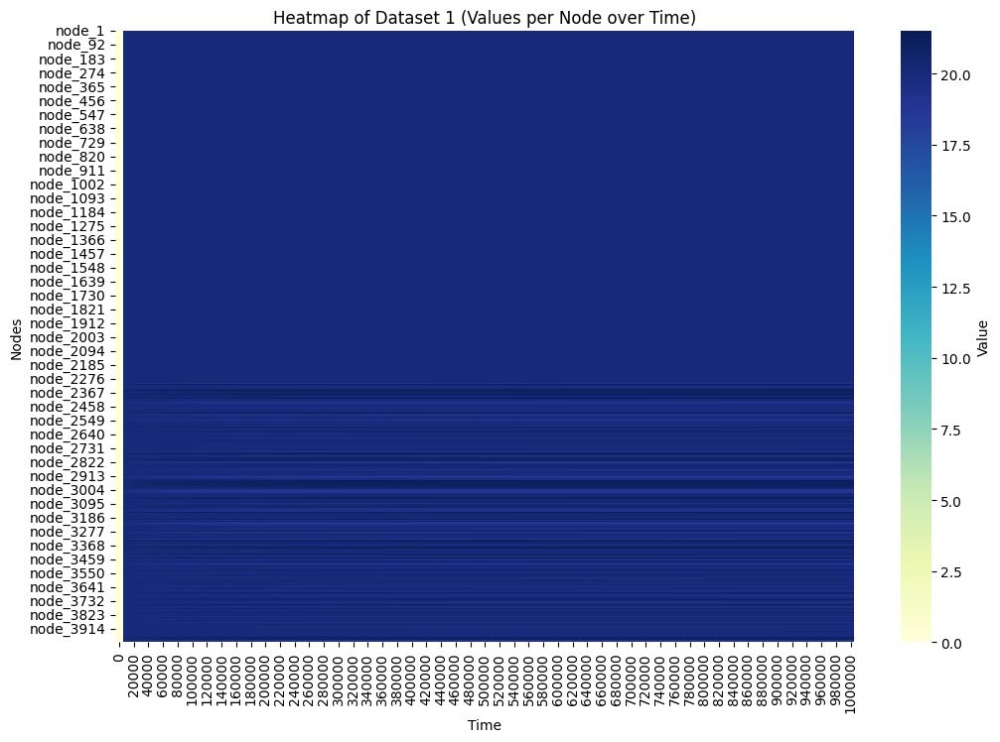

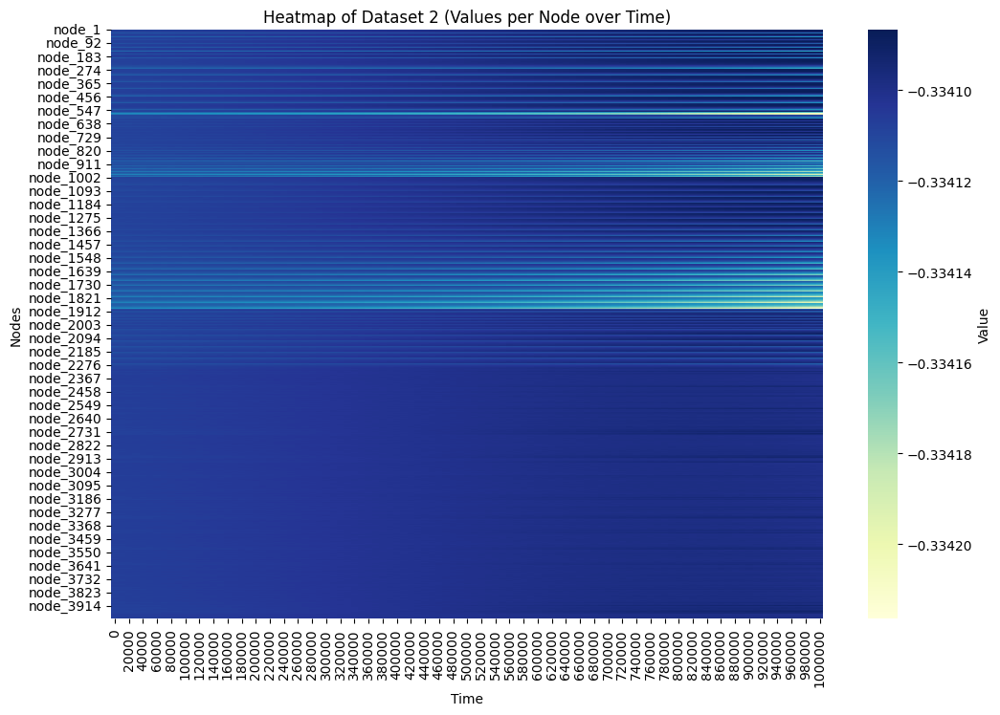

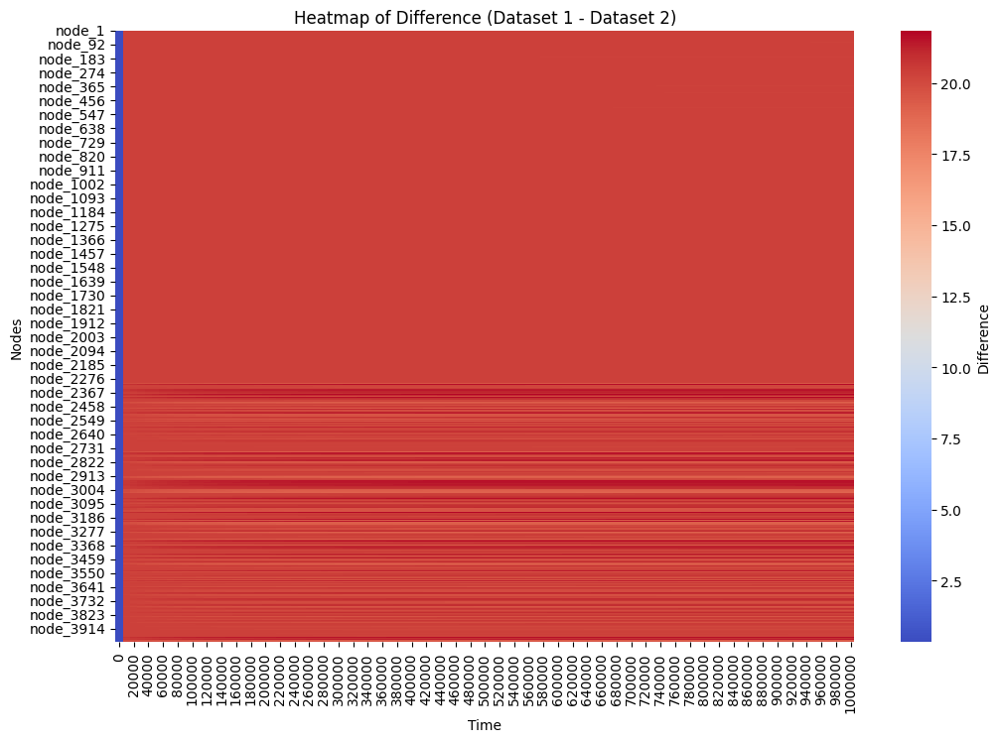

In [69]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
df3 = pd.read_excel('hydrogen_concentration.xlsx')  # First dataset
df4 = pd.read_excel('predictions_output.xlsx')  # Second dataset



# Heatmap for Dataset 1
plt.figure(figsize=(12, 8))
sns.heatmap(df3.set_index('time').T, cmap="YlGnBu", cbar_kws={'label': 'Value'})
plt.title("Heatmap of Dataset 1 (Values per Node over Time)")
plt.xlabel("Time")
plt.ylabel("Nodes")
plt.show()

# Heatmap for Dataset 2
plt.figure(figsize=(12, 8))
sns.heatmap(df4.set_index('time').T, cmap="YlGnBu", cbar_kws={'label': 'Value'})
plt.title("Heatmap of Dataset 2 (Values per Node over Time)")
plt.xlabel("Time")
plt.ylabel("Nodes")
plt.show()

df_diff = df3.set_index('time') - df4.set_index('time')
# Heatmap for the Difference
plt.figure(figsize=(12, 8))
sns.heatmap(df_diff.T, cmap="coolwarm", cbar_kws={'label': 'Difference'})
plt.title("Heatmap of Difference (Dataset 1 - Dataset 2)")
plt.xlabel("Time")
plt.ylabel("Nodes")
plt.show()

